# Introduction
Over the last few weeks, I have been looking for a new place to lease in Sydney. Based on inspecting a few places, I started to gain an understanding of what makes a place popular. Place that are close to public transport, reasonably priced, have 2-3 bedrooms and have inspections on weekends, are quite popular. As I did not have data from agents such as RayWhite in the Sydney market, I resorted to Kaggle to find a similar dataset. This data is from RentHop on the NYC real estate market. The challenge was to predict the number of inquiries a new listing received based on the listing’s features.

In this exploratory analysis, we will try to find which features makes a listing have higher level of interest.

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools as it
from collections import defaultdict, Counter
import folium
import warnings
from nltk.sentiment.vader import SentimentIntensityAnalyzer

%matplotlib inline
plt.style.use('ggplot')
warnings.filterwarnings('ignore')

## Read Data
Let's see "What the data says?"

In [38]:
train_data = pd.read_json('data/train.json')
test_data = pd.read_json("data/test.json")

interest_dict = {'low':0, 'medium':1, 'high':2}
train_data['interest'] = train_data['interest_level'].map(interest_dict)

print("Number of Rows in Train Set: {}".format(len(train_data.index)))
print("Number of Rows in Test Set: {}".format(len(test_data.index)))

train_data.tail(3)

Number of Rows in Train Set: 49352
Number of Rows in Test Set: 74659


,bathrooms,bedrooms,building_id,created,description,display_address,features,interest_level,latitude,listing_id,longitude,manager_id,photos,price,street_address,interest
99992,1.0,1,7967a1280bf3f7644500fc79d2696b0e,2016-04-16 02:13:40,Large Renovated One Bedroom Apartment with Sta...,West 45th Street,"[Doorman, Elevator, Pre-War, Dogs Allowed, Cat...",low,40.7601,6881461,-73.9900,d889a9552265fe359e7d36d172084fcb,[https://photos.renthop.com/2/6881461_20a86530...,2595,341 West 45th Street,0
99993,1.0,0,ad67f6181a49bde19218929b401b31b7,2016-04-08 02:13:33,Stylishly sleek studio apartment with unsurpas...,Wall Street,"[Doorman, Elevator, Pre-War, Dogs Allowed, Cat...",low,40.7066,6841891,-74.0101,9fd3af5b2d23951e028059e8940a55d7,[https://photos.renthop.com/2/6841891_124c9c44...,3350,37 Wall Street,0
99994,1.0,2,5173052db6efc0caaa4d817112a70f32,2016-04-12 02:48:07,Look no further!!! This giant 2 bedroom apart...,Park Terrace East,[Hardwood Floors],low,40.8699,6858245,-73.9172,d7f57128272bfd82e33a61999b5f4c42,[https://photos.renthop.com/2/6858245_c4380bde...,2200,30 Park Terrace East,0


# EDA

## Distribution of Target Variable

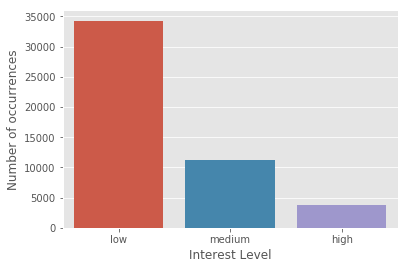

In [21]:
sns.countplot(train_data['interest_level'], order=['low', 'medium', 'high']);
plt.xlabel('Interest Level');
plt.ylabel('Number of occurrences');

Most of the listings have a lower level of interest, and it makes sense that not every listing is sought after.

## Explore Independant Variables

The independant variables that we have are:
* bathrooms
* bedrooms 
* building_id
* created
* description
* display_address
* features
* latitude
* listing_id
* longitude
* manager_id
* photos
* price
* street_address

Before we explore, it's worth building a mental map from our own experience about how each one of these features could influence the interest level.
* __bedrooms__: A unit having 2-3 bedrooms should have the highest level of interest - any more will be expensive and require a higher number of people together to come to an agreement.
* __bathrooms__: Similarly, around 1-2 bathrooms in a unit should have the highest level of interest.
* __building_id__: This is most probably an internal id for Renthop, so it should tell us if a particular unit was sought after or had lower levels of interest from people in the past.
* __created__ : time at which the listing was created. I believe a listing that is new in the market will have higher levels of interest.
* __display_address, latitude, longtiude, street_adress__: I am not sure what this will directly tell us about interest levels. However, it should tell us whether a unit is located in a safe and secure neighbourhood and close to amenities.
* __features__: Basic features, such as internet access, a nearby park, a washing machine, dishwasher, no extra price for bills and close to public transport, are sought after by most people. 
* __manager_id__: I believe if a manager can sell well, a property with a solid description, targeting the right group of people, will create more interest.
* __photos__: A decent number of photos of different parts of the property make it much more appealing to potential buyers/tenants. I believe a place with no photos will have lower interest.
* __price__: Humans generally want good value.

### Quick overview of the numerical data

In [22]:
train_data[['bathrooms', 'bedrooms', 'latitude', 'longitude', 'price']].describe()

,bathrooms,bedrooms,latitude,longitude,price
count,49352.00000,49352.000000,49352.000000,49352.000000,4.935200e+04
mean,1.21218,1.541640,40.741545,-73.955716,3.830174e+03
std,0.50142,1.115018,0.638535,1.177912,2.206687e+04
min,0.00000,0.000000,0.000000,-118.271000,4.300000e+01
25%,1.00000,1.000000,40.728300,-73.991700,2.500000e+03
50%,1.00000,1.000000,40.751800,-73.977900,3.150000e+03
75%,1.00000,2.000000,40.774300,-73.954800,4.100000e+03
max,10.00000,8.000000,44.883500,0.000000,4.490000e+06


It is interesting to see some listings have 0 bathrooms and bedrooms.
<br>
The minimum and maximum price of a listing are \$43 and \$4.4M respectively. Also, min latitude and max longitude are 0 degrees. This means there are outliers in the data.

Now, let's look at one feature at a time.

### Bathrooms

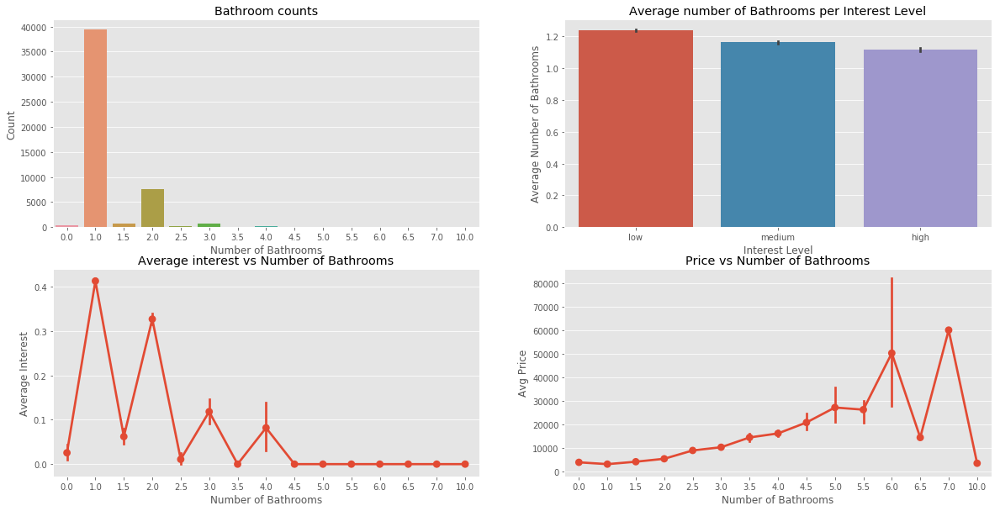

In [23]:
fig = plt.figure(figsize=(20,10))

sns.countplot(train_data['bathrooms'], ax = plt.subplot(221))
plt.xlabel('Number of Bathrooms')
plt.ylabel('Count')
plt.title("Bathroom counts")

sns.barplot(x='interest_level', y='bathrooms', 
            order=['low', 'medium', 'high'], 
            data=train_data, 
            ax = plt.subplot(222))
plt.xlabel('Interest Level')
plt.ylabel('Average Number of Bathrooms')
plt.title("Average number of Bathrooms per Interest Level")

sns.pointplot(x="bathrooms", y="interest", 
              data=train_data, 
              ax = plt.subplot(223))
plt.xlabel('Number of Bathrooms')
plt.ylabel('Average Interest')
plt.title("Average interest vs Number of Bathrooms")

sns.pointplot(x="bathrooms", y="price", 
              data=train_data, 
              ax = plt.subplot(224))
plt.xlabel('Number of Bathrooms')
plt.ylabel('Avg Price')
plt.title("Price vs Number of Bathrooms");

We can see that most of the listings have 1 or 2 bathrooms and people are more interested in listings with fewer numbers _(1 or 2)_ of bathrooms. As expected, as the number of bathrooms increases, price of a unit also increases.

### Bedrooms

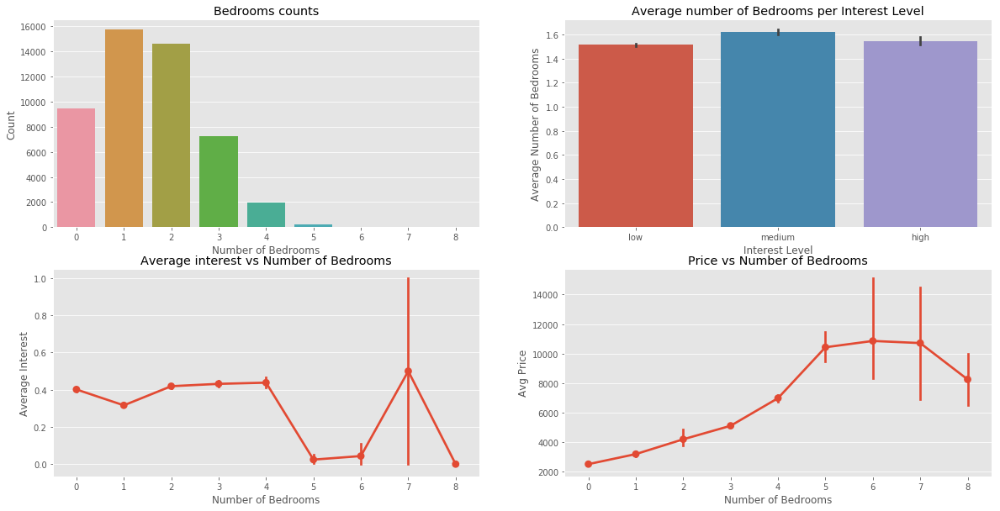

In [24]:
fig = plt.figure(figsize=(20,10))

sns.countplot(train_data['bedrooms'], ax = plt.subplot(221));
plt.xlabel('Number of Bedrooms')
plt.ylabel('Count')
plt.title("Bedrooms counts")

sns.barplot(x='interest_level', y='bedrooms', 
            data=train_data, 
            order=['low', 'medium', 'high'],
            ax = plt.subplot(222))
plt.xlabel('Interest Level')
plt.ylabel('Average Number of Bedrooms')
plt.title("Average number of Bedrooms per Interest Level")

sns.pointplot(x="bedrooms", y="interest", 
              data=train_data, 
              ax = plt.subplot(223))
plt.xlabel('Number of Bedrooms')
plt.ylabel('Average Interest')
plt.title("Average interest vs Number of Bedrooms")

sns.pointplot(x="bedrooms", y="price", 
              data=train_data, 
              ax = plt.subplot(224))
plt.xlabel('Number of Bedrooms')
plt.ylabel('Avg Price')
plt.title("Price vs Number of Bedrooms");

We again see that listings with 2-4 bedrooms in general have more average interest.

### Created

In [40]:
train_data.created = pd.to_datetime(train_data.created, format='%Y-%m-%d %H:%M:%S')
                                    
train_data['hour'] = train_data.created.dt.hour
train_data['date'] = train_data.created.dt.date
train_data['day_of_week'] = train_data.created.dt.weekday_name
train_data['day_of_week_n'] = train_data.created.dt.weekday
train_data['month'] = train_data.created.dt.month
train_data['year'] = train_data.created.dt.year

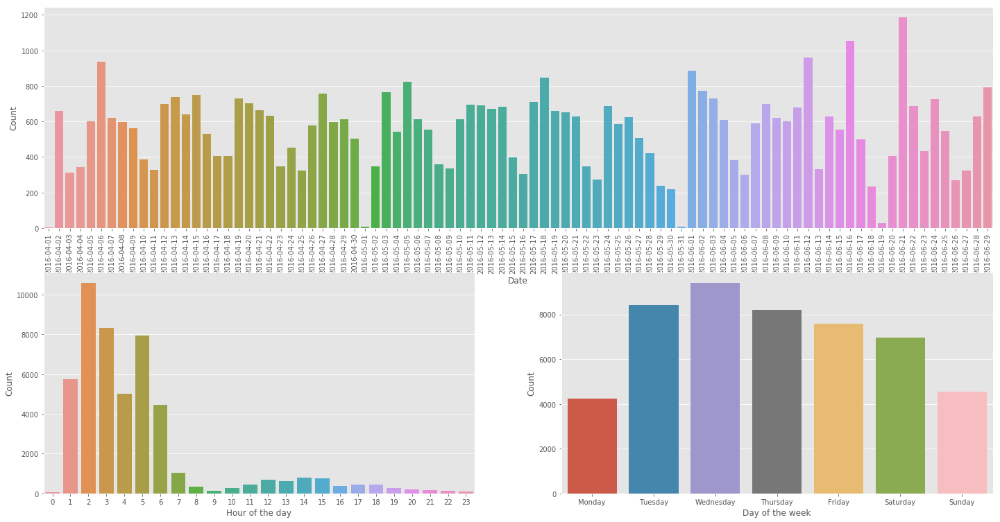

In [41]:
fig = plt.figure(figsize=(20,10))
fig.subplots_adjust(bottom=0.0001, left=0.025, top = 0.975, right=0.975)

sns.countplot(x="date",
              data=train_data.sort_values('date'),
              ax = plt.subplot(211))
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation='vertical')

sns.countplot(x="hour",
              data=train_data,
              ax = plt.subplot(223))
plt.xlabel('Hour of the day')
plt.ylabel('Count')

sns.countplot(x="day_of_week",
              order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 
              data=train_data, 
              ax = plt.subplot(224))
plt.xlabel('Day of the week')
plt.ylabel('Count');

All the listings were created from April-June 2016.
Additionally, most of them were created in the less busy hours of the day *(early mornings)* from Tuesday-Saturday of each week.

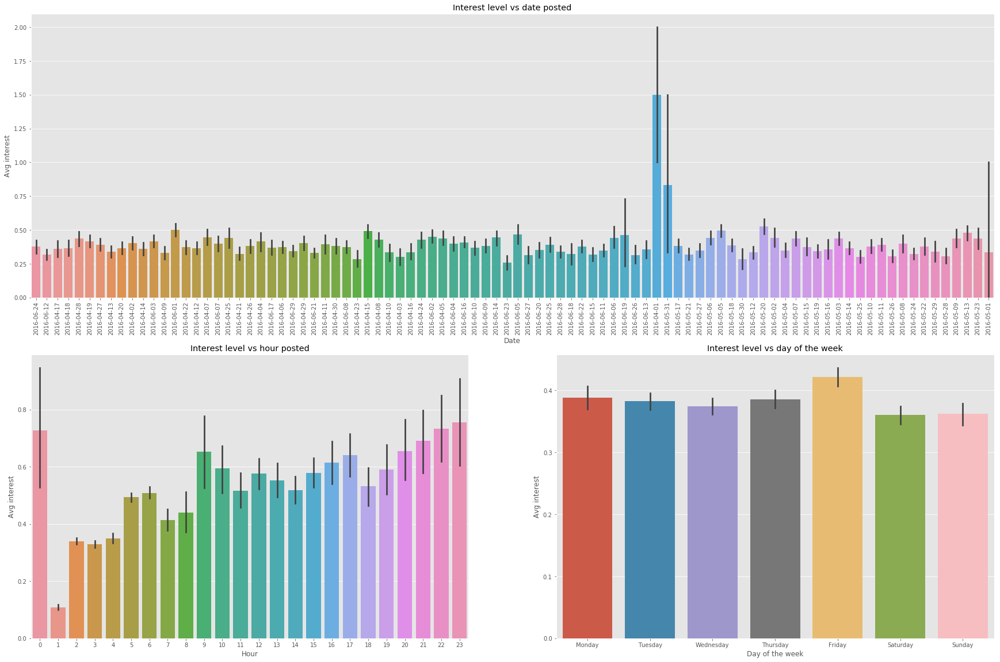

In [53]:
fig = plt.figure(figsize=(30,20))

sns.barplot(x="date", y="interest", 
            data=train_data, 
            ax=plt.subplot(211));
plt.xlabel("Date")
plt.ylabel("Avg interest")
plt.title("Interest level vs date posted");
plt.xticks(rotation='vertical')

sns.barplot(x="hour", y="interest", 
            data=train_data, 
            ax=plt.subplot(223));
plt.xlabel("Hour")
plt.ylabel("Avg interest")
plt.title("Interest level vs hour posted");

sns.barplot(x="day_of_week", y="interest", 
            data=train_data, 
            order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
            ax=plt.subplot(224));
plt.xlabel("Day of the week")
plt.ylabel("Avg interest")
plt.title("Interest level vs day of the week");

We see listings posted on Apr 1, 2016 had quite high levels of interest.
It seems listings posted on Friday have higher level of interest.

### Price

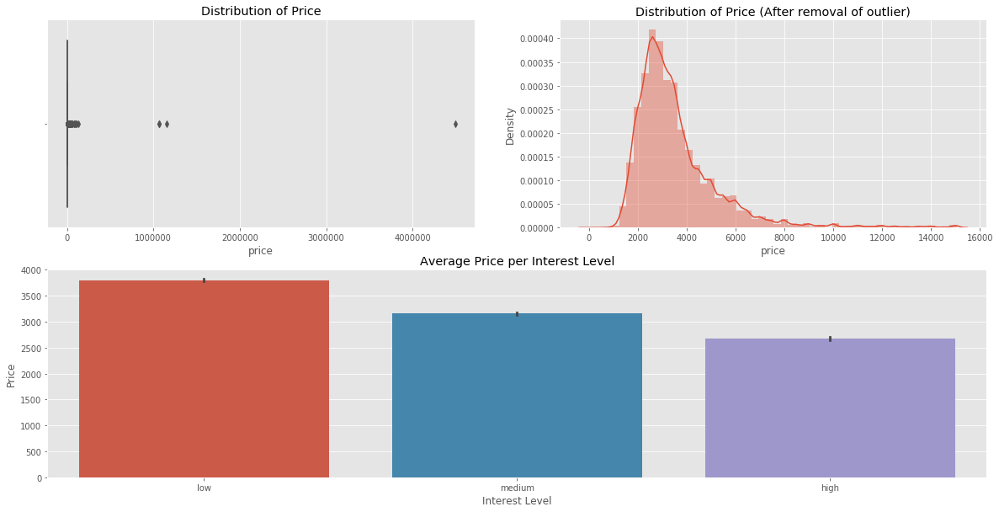

In [27]:
fig = plt.figure(figsize=(20,10))

# Check for Outlier
sns.boxplot(train_data['price'], 
               ax = plt.subplot(221))
plt.title("Distribution of Price")

ulimit = train_data['price'].quantile(0.995)
train_price_nooutlier = train_data.loc[train_data['price'] < ulimit , :]
sns.distplot(train_price_nooutlier['price'], 
               ax = plt.subplot(222))
plt.ylabel("Density")
plt.title("Distribution of Price (After removal of outlier)")

sns.barplot(x="interest_level", y="price", 
            order=['low', 'medium', 'high'],
            data=train_price_nooutlier, 
            ax=plt.subplot(212));
plt.xlabel("Interest Level")
plt.ylabel("Price")
plt.title("Average Price per Interest Level");

As expected, we see the \$4.4M outlier. Hence, we considered only the top 99.5 percent.
<br>
Additionally, we can also see that there is a higher interest in lower priced listings.

### Photos

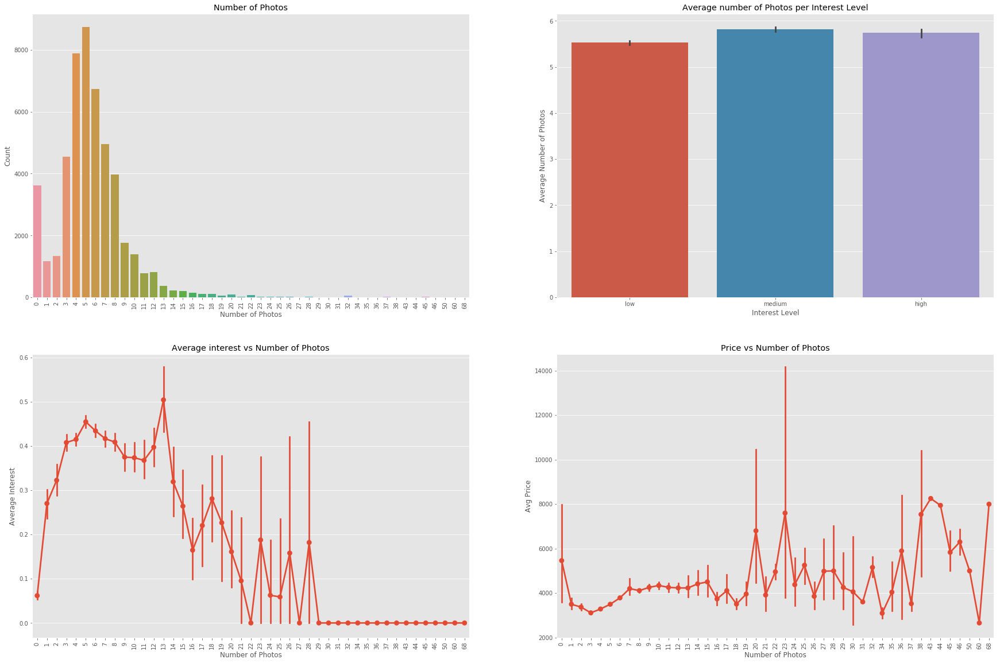

In [49]:
train_data['num_photos'] = train_data['photos'].str.len()

fig = plt.figure(figsize=(30,20))

sns.countplot(train_data['num_photos'], ax = plt.subplot(221));
plt.xlabel('Number of Photos')
plt.ylabel('Count')
plt.title("Number of Photos")
plt.xticks(rotation='vertical')

sns.barplot(x='interest_level', y='num_photos', 
            data=train_data, 
            order=['low', 'medium', 'high'],
            ax = plt.subplot(222))
plt.xlabel('Interest Level')
plt.ylabel('Average Number of Photos')
plt.title("Average number of Photos per Interest Level")

sns.pointplot(x="num_photos", y="interest", 
              data=train_data, 
              ax = plt.subplot(223))
plt.xlabel('Number of Photos')
plt.ylabel('Average Interest')
plt.title("Average interest vs Number of Photos")
plt.xticks(rotation='vertical')

sns.pointplot(x="num_photos", y="price", 
              data=train_data, 
              ax = plt.subplot(224))
plt.xlabel('Number of Photos')
plt.ylabel('Avg Price')
plt.xticks(rotation='vertical')
plt.title("Price vs Number of Photos");

We can see that listings with less photos have lower levels of interest, and too many photos is overwhelming for people.
So a listing having around 3-15 photos seems to create the most interest.

### Display Address

There are 6331 unique addresses.


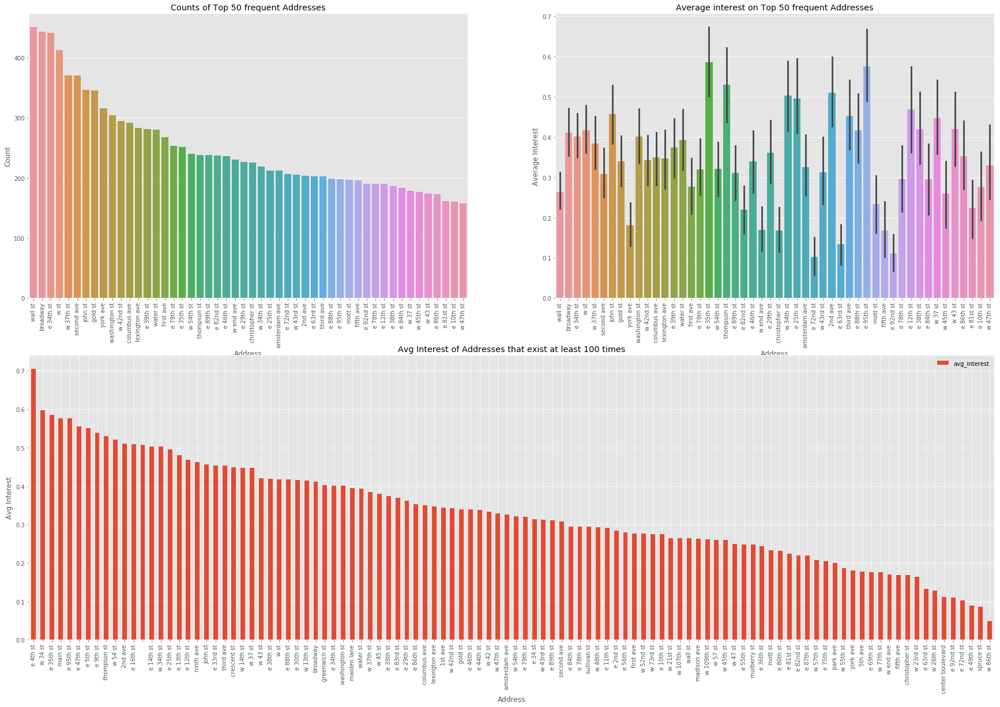

In [50]:
def clean(address):
    return " ".join(address.strip("-,.$*!#&\'\t").replace("'",'').lower()\
              .replace('street', 'st').replace('avenue', 'ave')\
              .replace('east', 'e').replace('west', 'w').split())

train_data["display_address_cl"] = train_data["display_address"].apply(clean)
train_data["street_address_cl"] = train_data["street_address"].apply(clean)

print("There are {} unique addresses.".format(train_data["display_address_cl"].nunique()))

dd = defaultdict(list)
for row in train_data.itertuples():
    add = row.display_address_cl
    dd[add].append(row.interest)

df = pd.DataFrame(list(dd.items()), columns=["address", "address_interest"])
df['avg_interest'] = df["address_interest"].apply(np.mean)
df['count'] = df["address_interest"].apply(len)

fig = plt.figure(figsize=(30,20))
n=50
top_addresses = train_data["display_address_cl"].value_counts().nlargest(n).keys()

sns.countplot(train_data.loc[train_data["display_address_cl"].isin(top_addresses), "display_address_cl"], 
              order = top_addresses,
              ax = plt.subplot(221));
plt.xlabel('Address')
plt.ylabel('Count')
plt.title("Counts of Top {n} frequent Addresses".format(n=n))
plt.xticks(rotation='vertical')

sns.barplot(x="display_address_cl", y="interest", 
            data=train_data.loc[train_data["display_address_cl"].isin(top_addresses), :], 
            order = top_addresses,
            ax = plt.subplot(222))
plt.xlabel('Address')
plt.ylabel('Average Interest')
plt.title("Average interest on Top {n} frequent Addresses".format(n=n))
plt.xticks(rotation='vertical')

ax = df.loc[df["count"]>=100, ["address", "avg_interest"]].sort_values("avg_interest", ascending=False).set_index("address")\
    .plot(kind='bar', title="Avg Interest of Addresses that exist at least 100 times", ax=plt.subplot(212))
ax.set_ylabel("Avg Interest")
ax.set_xlabel("Address");

### Location Coordinates

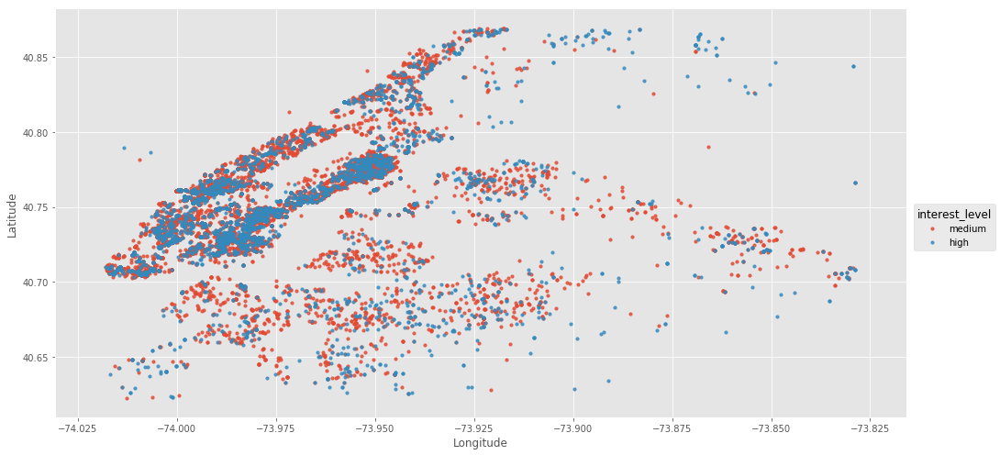

In [52]:
train_ll_nooutlier = train_data.loc[
    (train_data['longitude'] > train_data['longitude'].quantile(0.005)) &
    (train_data['longitude'] < train_data['longitude'].quantile(0.995)) &
    (train_data['latitude']  > train_data['latitude'].quantile(0.005))  &                           
    (train_data['latitude']  < train_data['latitude'].quantile(0.995)), :]

sns.lmplot(x="longitude", y="latitude", 
           fit_reg=False, 
           hue='interest_level',
           hue_order=["medium", "high"],
           scatter = True,
           size=7,
           aspect=2,
           scatter_kws={"s": 10},
           data=train_ll_nooutlier.loc[train_ll_nooutlier["interest_level"].isin(["medium", "high"]), :])
plt.xlabel('Longitude')
plt.ylabel('Latitude');

We can see that there most of the listings are between -73.9 and -74 degrees longitude and 40.70 and 40.80 degrees latitude.
Out of that most of them are located in the Manhattan area.

In [31]:
location_list_high = train_ll_nooutlier.loc[train_ll_nooutlier["interest_level"]=='high', 
                                       ["latitude", "longitude", "display_address_cl"]].values.tolist()

nycmap_high = folium.Map(location=[40.74, -73.95], zoom_start=12)
marker_cluster_high = folium.MarkerCluster().add_to(nycmap_high)

for latti, longi, address in location_list_high:
    folium.Marker([latti, longi], popup=address).add_to(marker_cluster_high)

nycmap_high

We see 4 big clusters in the Manhattan area where demand is _high_.


### Number of features

Total unique features: 1267


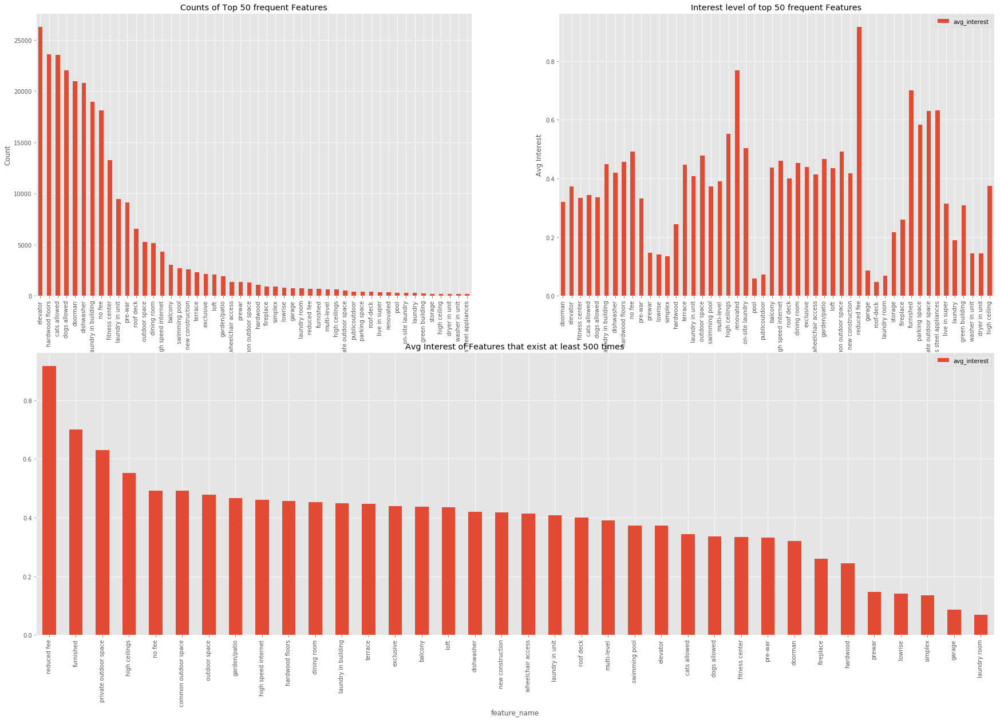

In [32]:
train_data["num_features"] = train_data["features"].apply(len)
train_data["features_cl"] = train_data["features"].apply(lambda fl: list(map(lambda f:f.strip("-,.$*!#&\'\t").replace("'",'').lower(), fl)))
feature_df = pd.Series(list(it.chain.from_iterable(train_data["features_cl"].values.tolist())))
n=50
top_features = feature_df.value_counts().nlargest(n)
print("Total unique features: {}".format(feature_df.nunique()))

dd = defaultdict(list)
for row in train_data.itertuples():
    fl = row.features_cl
    for f in fl:
        dd[f].append(row.interest)

df = pd.DataFrame(list(dd.items()), columns=["feature_name", "feature_interest"])
df['avg_interest'] = df["feature_interest"].apply(np.mean)
df['count'] = df["feature_interest"].apply(len)

fig = plt.figure(figsize=(30,20))
ax = top_features.plot(kind='bar', title="Counts of Top {n} frequent Features".format(n=n), ax=plt.subplot(221))
ax.set_ylabel("Count")

ax = df.loc[df["feature_name"].isin(top_features.keys()), ["feature_name", "avg_interest"]].set_index("feature_name")\
    .plot(kind='bar', title="Interest level of top {n} frequent Features".format(n=n), ax=plt.subplot(222))
ax.set_ylabel("Avg Interest")

df.loc[df["count"]>=500,["feature_name", "avg_interest"]].sort_values("avg_interest", ascending=False).set_index("feature_name")\
    .plot(kind='bar', title="Avg Interest of Features that exist at least 500 times", ax=plt.subplot(212))
ax.set_ylabel("Avg Interest")
ax.set_xlabel("Feature");

We can see that if a listing has a reduced_fee, is furnished, has outdoor space and internet, it has higher interest.

### Manger Id

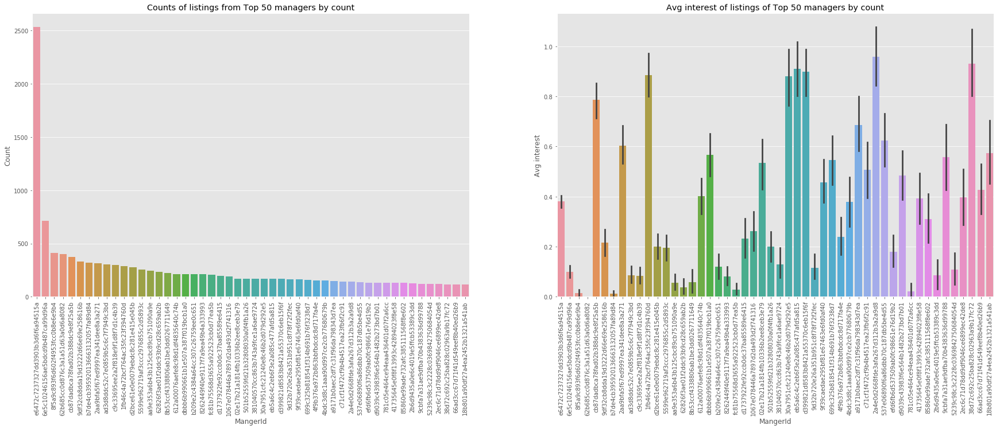

In [33]:
top50_managers = train_data['manager_id'].value_counts(ascending=False).keys()[:50];

fig = plt.figure(figsize=(30,20))
sns.countplot(
    x="manager_id",
    data=train_data.loc[train_data["manager_id"].isin(top50_managers), ["manager_id", "interest_level"]], 
    order = top50_managers,
    ax = plt.subplot(221))
plt.xlabel('MangerId')
plt.ylabel('Count')
plt.title("Counts of listings from Top {n} managers by count".format(n=n))
plt.xticks(rotation='vertical')

sns.barplot(x = 'manager_id', 
            y = 'interest',
            data=train_data.loc[train_data["manager_id"].isin(top50_managers), ["manager_id", "interest"]], 
            order = top50_managers,
            ax = plt.subplot(222))
ax.set_ylabel("Count")
plt.xlabel('MangerId')
plt.ylabel('Avg interest')
plt.title("Avg interest of listings of Top {n} managers by count".format(n=n))
plt.xticks(rotation='vertical');

As we can clearly see, different managers have different skill levels, even when they have a similar number of entries. Could it be because some managers are lucky to get good listings, or those managers really do their job well?

### Building Id

Number of entries: 49352, Number of unique buildings: 7585


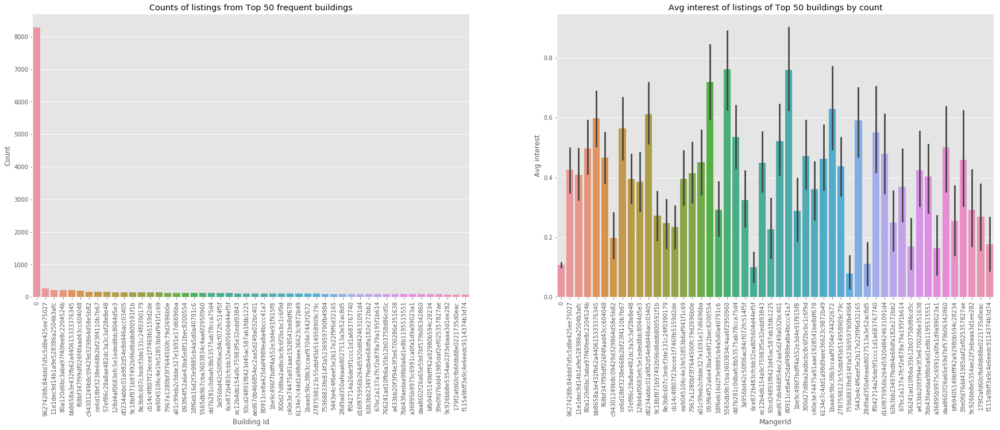

In [34]:
print("Number of entries: {}, Number of unique buildings: {}".format(len(train_data.index), train_data['building_id'].nunique()))
top50_buildings = train_data['building_id'].value_counts(ascending=False).keys()[:50];

fig = plt.figure(figsize=(30,20))
sns.countplot(
    x="building_id",
    data=train_data.loc[train_data["building_id"].isin(top50_buildings), ["building_id", "interest_level"]], 
    order = top50_buildings,
    ax = plt.subplot(221))
plt.xlabel('Building Id')
plt.ylabel('Count')
plt.title("Counts of listings from Top {n} frequent buildings".format(n=n))
plt.xticks(rotation='vertical');

sns.barplot(x = 'building_id', 
            y = 'interest',
            data=train_data.loc[train_data["building_id"].isin(top50_buildings), ["building_id", "interest"]], 
            order = top50_buildings,
            ax = plt.subplot(222))
ax.set_ylabel("Count")
plt.xlabel('MangerId')
plt.ylabel('Avg interest')
plt.title("Avg interest of listings of Top {n} buildings by count".format(n=n))
plt.xticks(rotation='vertical');

In [35]:
location_list_0 = train_data.loc[train_data["building_id"]=='0', 
                                       ["latitude", "longitude", "display_address_cl"]].values.tolist()

nycmap_0 = folium.Map(location=[40.74, -73.95], zoom_start=12)
marker_cluster_0 = folium.MarkerCluster().add_to(nycmap_0)

for latti, longi, address in location_list_0[:3000]:
    folium.Marker([latti, longi], popup=address).add_to(marker_cluster_0)

nycmap_0

It seems there are multiple entries for each building. Interestingly, quite a large number of buildings are marked as 0 and most of them have low interest.

### Description

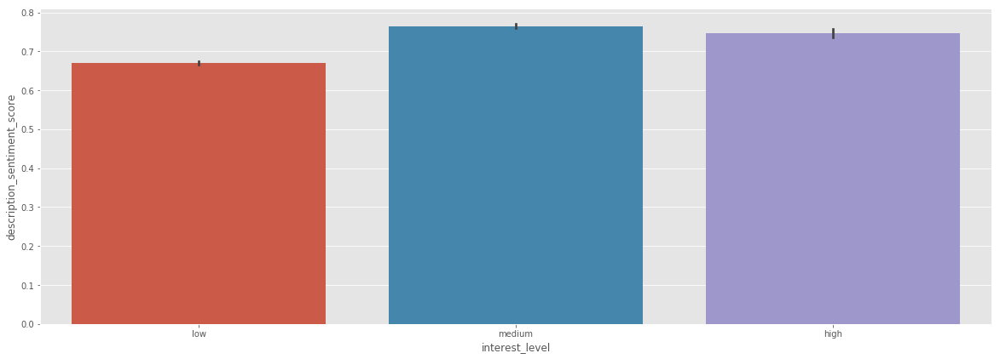

In [36]:
sid = SentimentIntensityAnalyzer()
train_data["description_sentiment_score"] = train_data["description"].apply(lambda desc: sid.polarity_scores(desc).get('compound'))

fig = plt.figure(figsize=(20,15))
sns.barplot(x="interest_level",
            y="description_sentiment_score",
            order = ["low", "medium", "high"],
            data=train_data, 
            ax=plt.subplot(211));

It is interesting to see that the sentiment of the description matters when it comes to whether a listing will have a higher or lower level of interest. We can clearly see that a positively written description will have a higher level of interest.

## Interaction between 2 variables

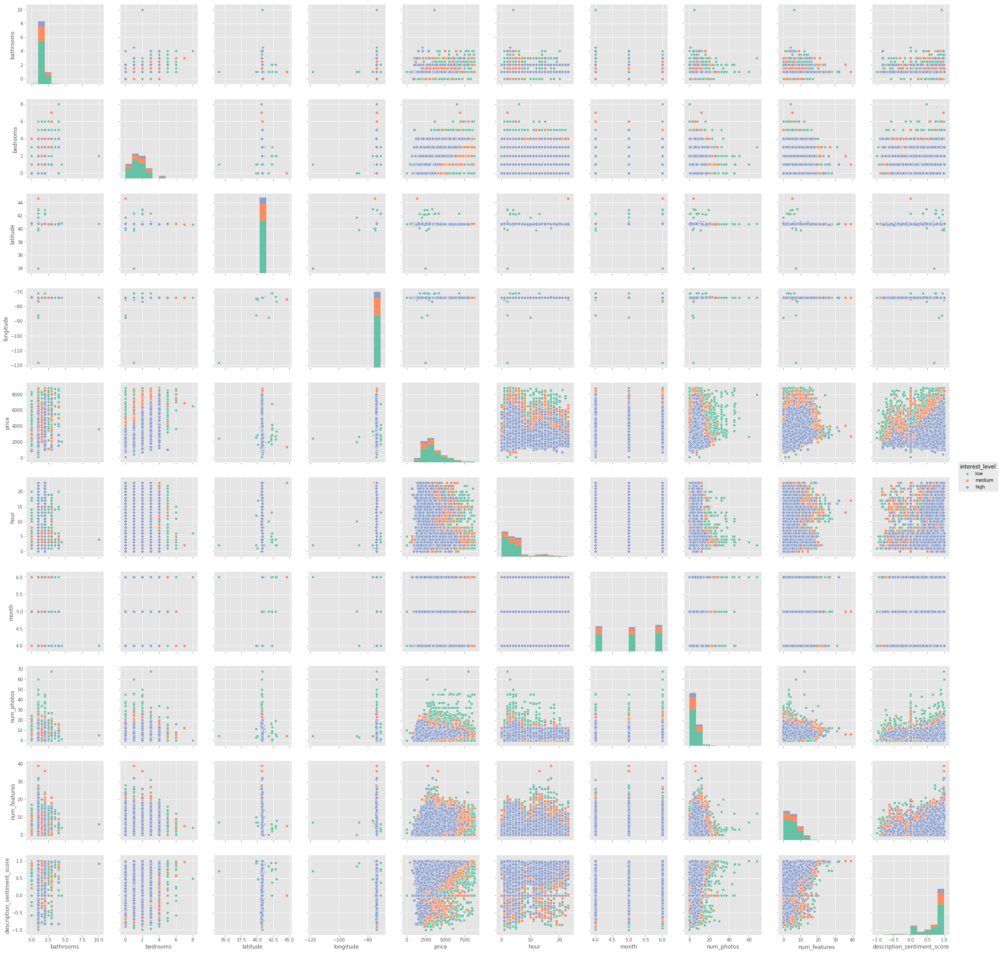

In [37]:
cols = ['bathrooms', 'bedrooms', 'latitude', 'longitude', 'price',
            'interest_level', 'hour', 'date', 'day_of_week', 
            'month', 'num_photos', 'num_features', 'description_sentiment_score']
g = sns.pairplot(train_data.loc[(train_data.price < train_data.price.quantile(0.975)) & 
                                (train_data.latitude != 0) & 
                                (train_data.longitude != 0), 
                                cols], 
                 hue='interest_level', 
                 markers=["o", "s", "D"],
                 hue_order = ["low", "medium", "high"],
                 size=3,
                 palette='Set2')

From this plot, we can see that Price is quite an important feature. It seems in most cases, there is a linear interaction with the other features.

# Conclusion 

As listing will probably have high interest if it has:
* a price between \$2.7k-\$3.2k, 
* 1-2 bathrooms, 
* 2-4 bedrooms, 
* a skilled manager,
* been posted on a Friday,
* a well written description with positive sentiment,
* around 5 photos, 
* reduced fee, 
* furnishings,
* outdoor space and 
* internet